In [1]:
import sys 
sys.path.insert(1, '../')

In [2]:
import os
import pylab as plt
import numpy as np
from matplotlib import rcParams
from tqdm import tqdm

from Models.Higgins1D.Higgins1DConfiguration import Higgins1DConfiguration, Higgins1DTdmaParameters
from Models.Higgins1D.Higgins1DTdmaSolver import integrate_tdma_implicit_scheme
from MathHelpers.InitDataHelpers import get_cos, get_normal_rand
from DataAnalyzers.PicksAnalyzer import calc_picks
from DataContainers.Experiment import Experiment

from Drawing.DrawHiggins1D import draw_amps_stat, draw_transient, draw_timeline_deltas, draw_arr_WxH
from Drawing.DrawHelper import set_defaults_1D

In [3]:
base_dir = 'D:\\math\\data14_11_2020_mko'
set_defaults_1D()

In [4]:
def draw_arr(res, left_border=None, right_border=None,w = 3, h = 3):
    fig, axes = plt.subplots(w,h, figsize=(30,15))
    for i,k in enumerate(res):
        ax =axes[i//h][i%h]
        draw_transient(res[i],ax=ax, left_border=left_border, right_border=right_border)
        ax.set_title(f"$dx = {k.method_parameters['dx']} \quad  dt = {k.method_parameters['dt']}$", fontsize=22)
    title = f"$p={res[i].model_config['p']}, q={res[i].model_config['q']}, D_u={res[i].model_config['Du']}, init={calc_picks(res[i].init_values['u'])}$"
    fig.suptitle(title)
    title = title[1:-1].replace("'", "").replace("{", "").replace("}", "").replace(":","")
    plt.savefig(f'data/{title}_{left_border}_{right_border}.png')
    plt.show()

In [36]:
res = {}
conf = Higgins1DConfiguration(2.0, 2.0, 16.5, 1)
for peaks in tqdm([1,2,3,4,5]):
    res[peaks] = []
    for dt in [0.1,0.05, 0.01]:
        for dx in [0.2,0.1,0.05]:
            u_init = get_cos(peaks, int(round(200*0.2/dx)),1.0, 0.1)
            v_init = get_cos(peaks, int(round(200*0.2/dx)),1.0, 0.1)
            params = Higgins1DTdmaParameters(u_init, v_init, dx, dt, 5000.0, save_timeline=True, timeline_save_step_delta=int(round(2*0.1/dt)))
            res[peaks].append(integrate_tdma_implicit_scheme(conf, params))

100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [01:34<00:00, 18.94s/it]


{'dx': 0.2, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.01, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 20, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.01, 't_max': 5000.0, 

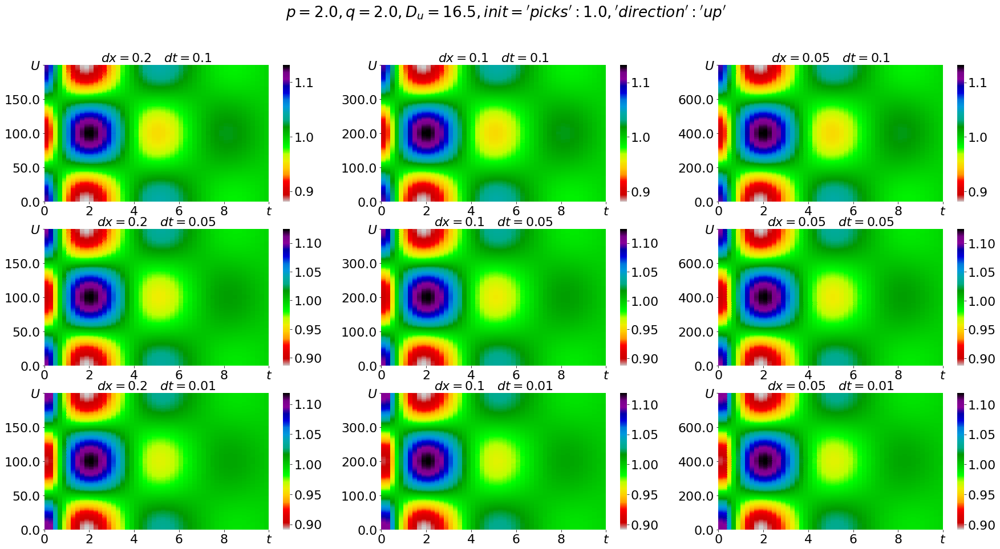

{'dx': 0.2, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.01, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 20, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.01, 't_max': 5000.0, 

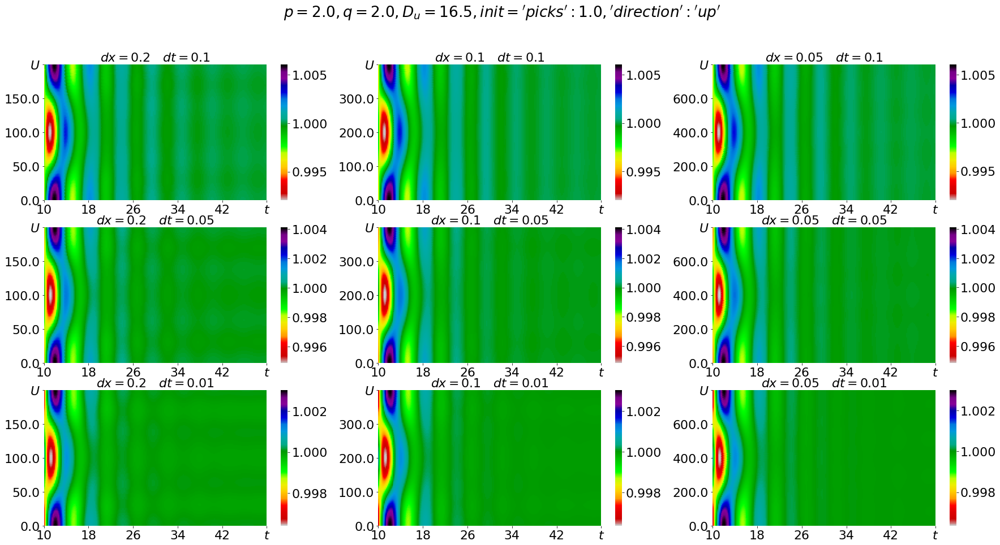

{'dx': 0.2, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.01, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 20, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.01, 't_max': 5000.0, 

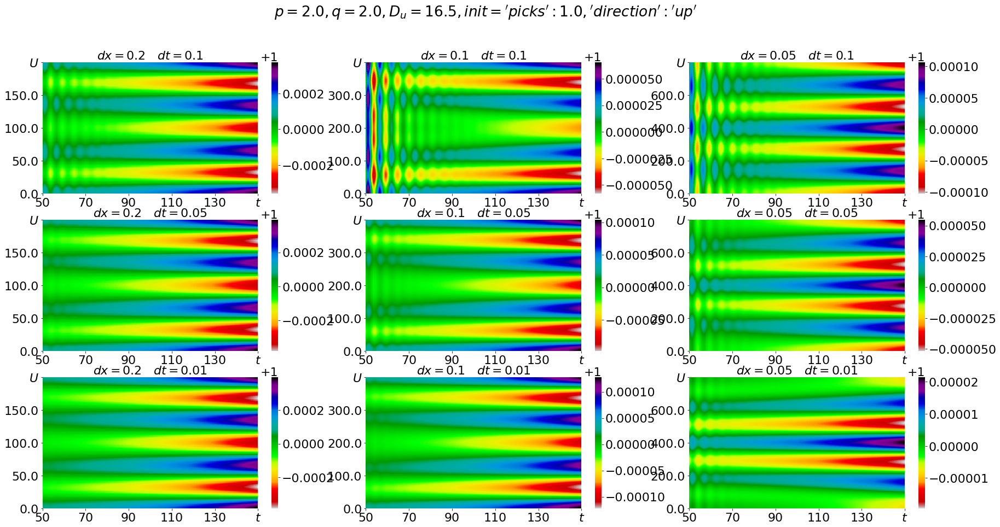

{'dx': 0.2, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.01, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 20, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.01, 't_max': 5000.0, 

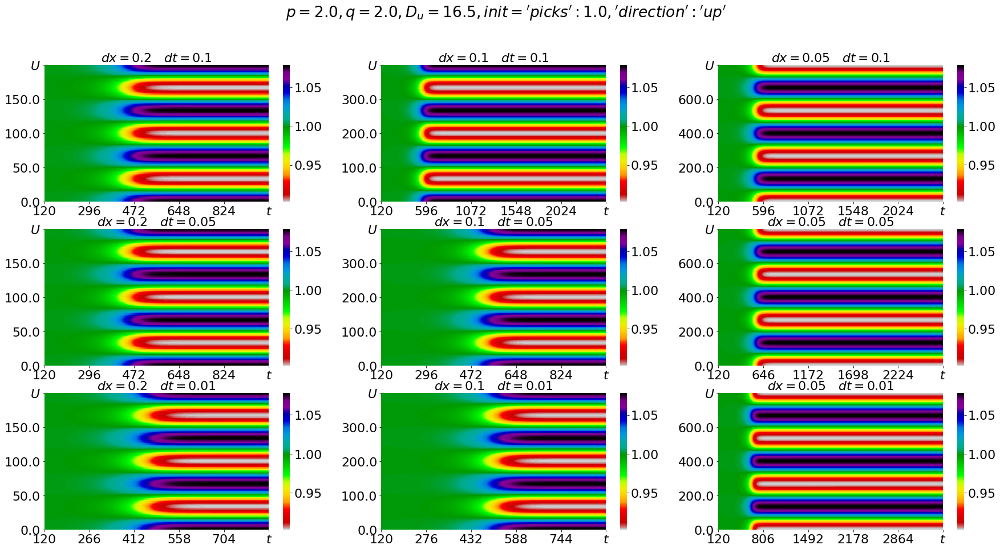


---------------------------

{'dx': 0.2, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.01, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 20, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1,

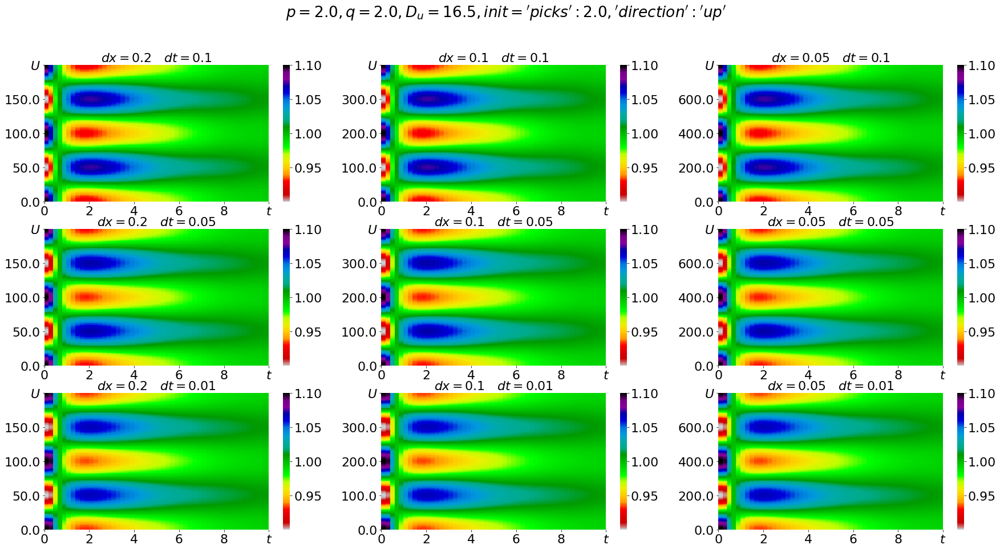

{'dx': 0.2, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.01, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 20, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.01, 't_max': 5000.0, 

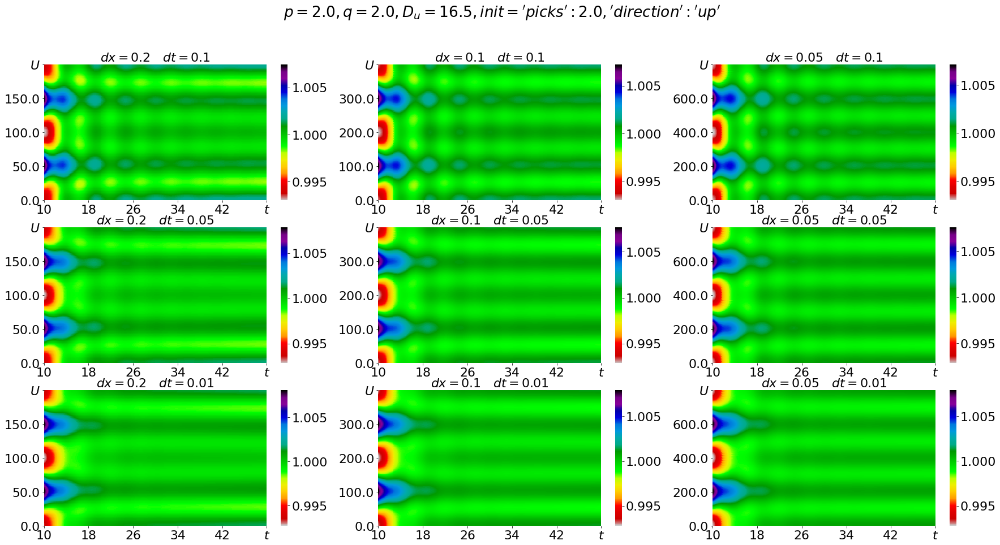

{'dx': 0.2, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.01, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 20, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.01, 't_max': 5000.0, 

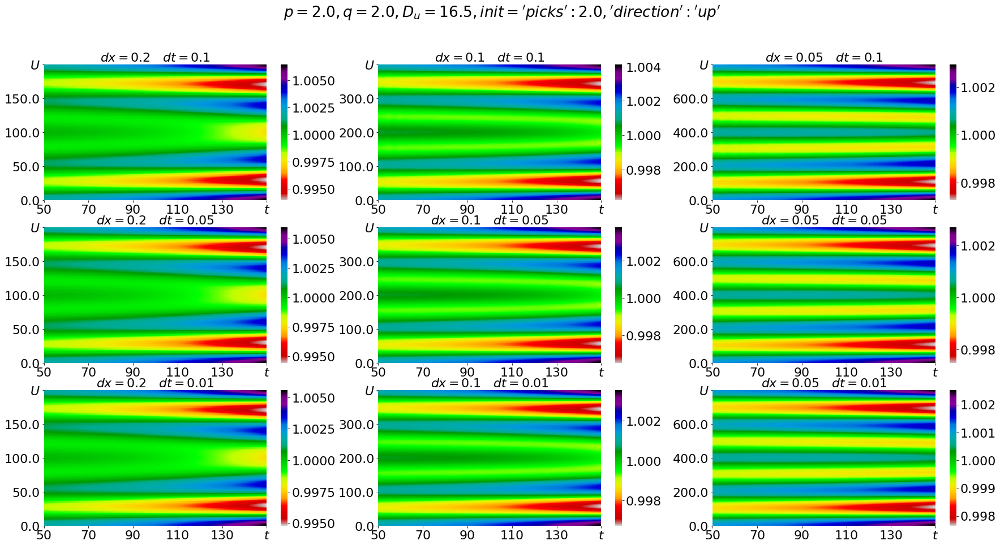

{'dx': 0.2, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.01, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 20, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.01, 't_max': 5000.0, 

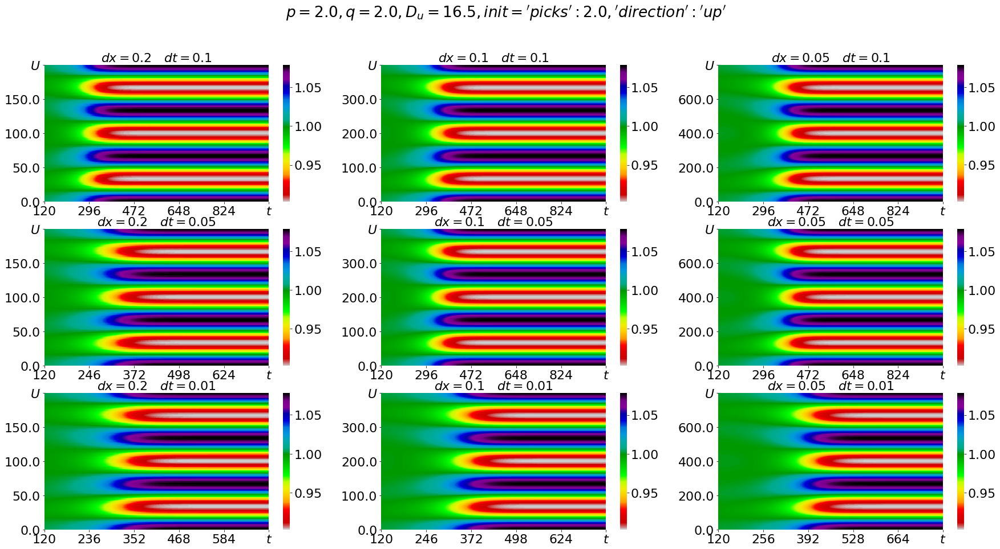


---------------------------

{'dx': 0.2, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.01, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 20, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1,

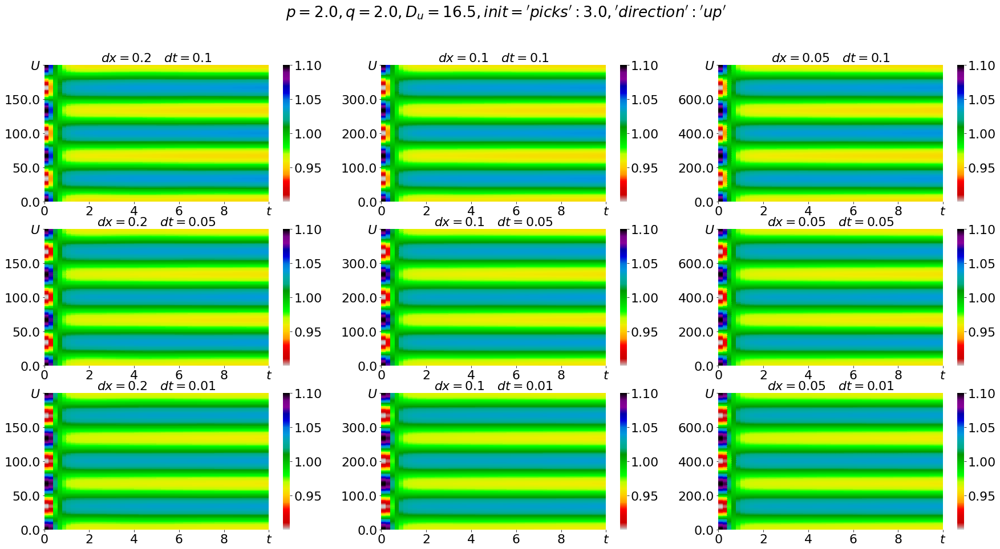

{'dx': 0.2, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.01, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 20, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.01, 't_max': 5000.0, 

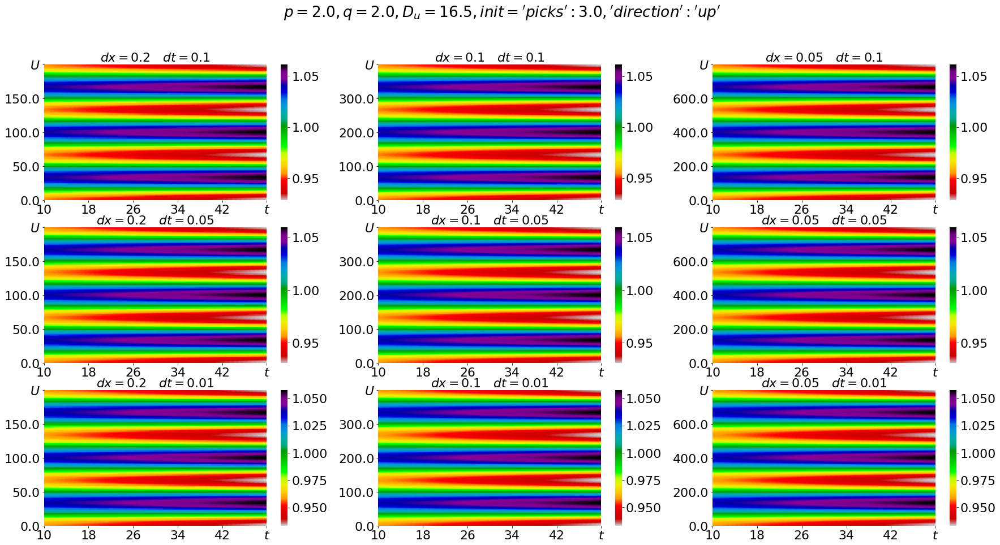

{'dx': 0.2, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.01, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 20, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.01, 't_max': 5000.0, 

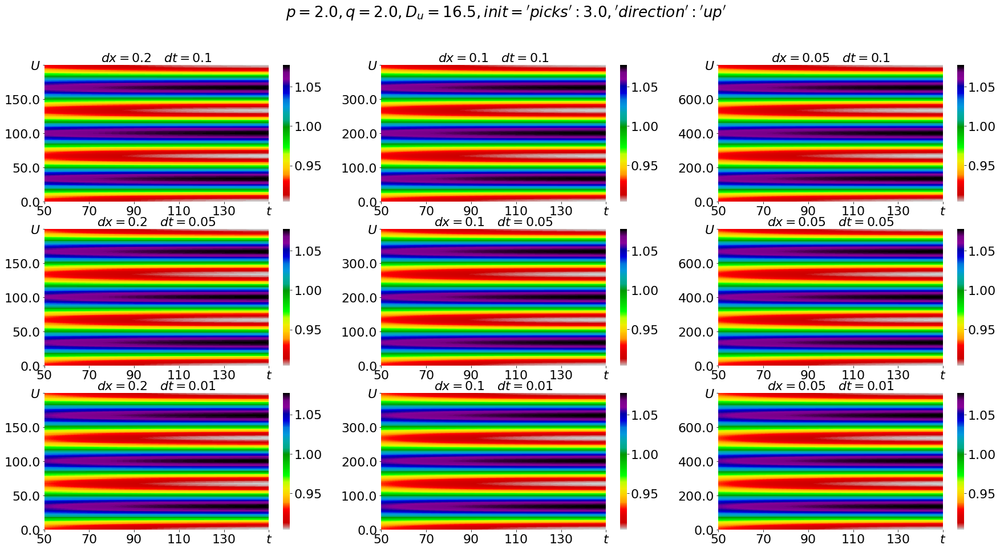

{'dx': 0.2, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.01, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 20, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.01, 't_max': 5000.0, 

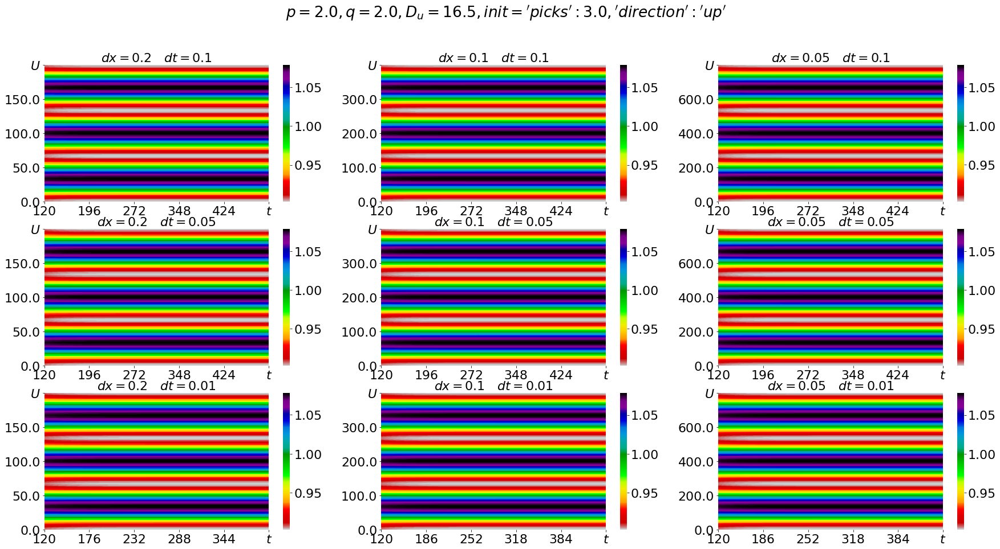


---------------------------

{'dx': 0.2, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.01, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 20, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1,

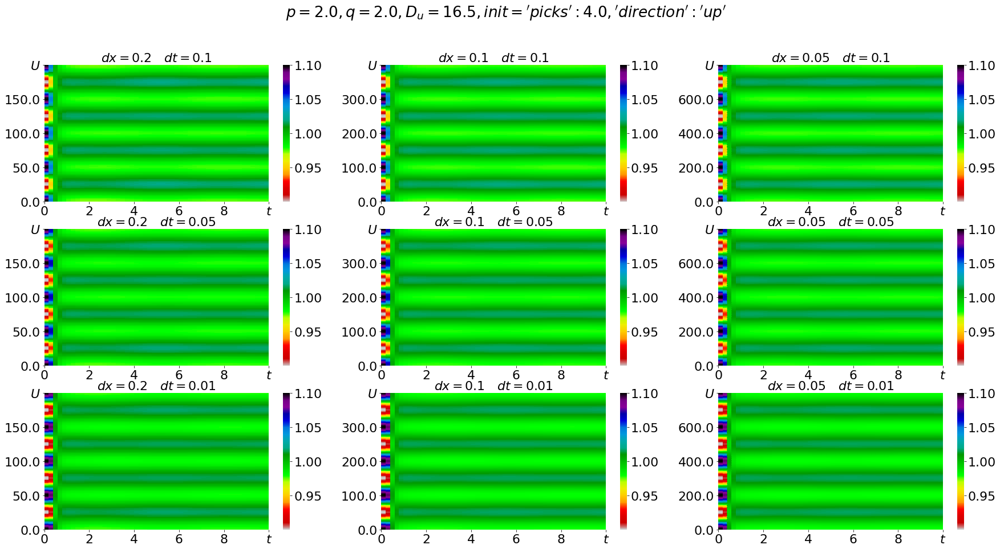

{'dx': 0.2, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.01, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 20, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.01, 't_max': 5000.0, 

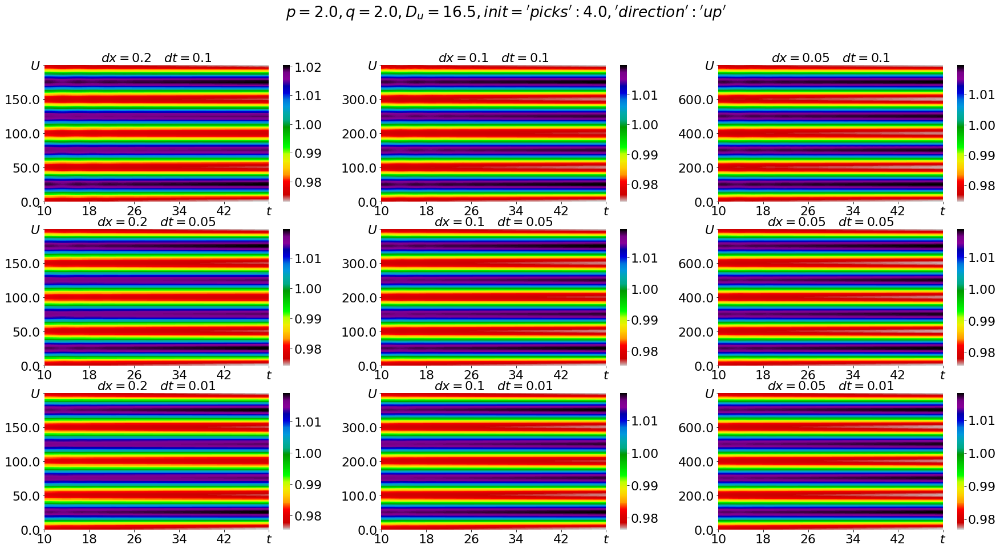

{'dx': 0.2, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.01, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 20, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.01, 't_max': 5000.0, 

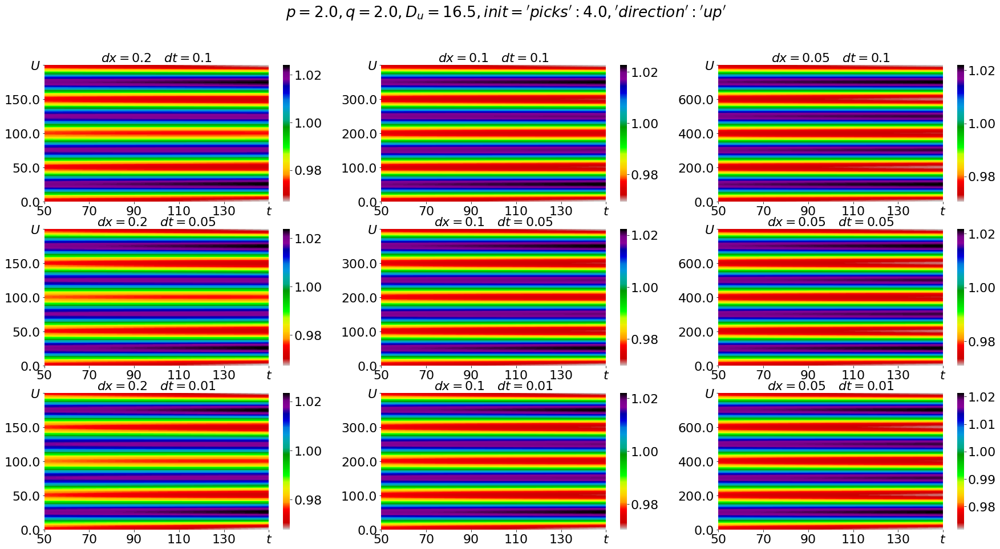

{'dx': 0.2, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.01, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 20, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.01, 't_max': 5000.0, 

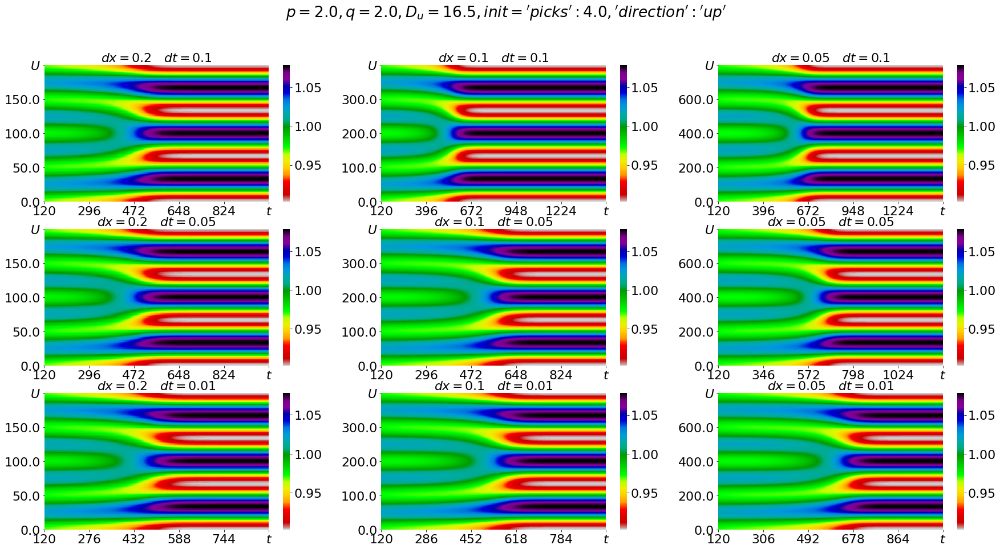


---------------------------

{'dx': 0.2, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.01, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 20, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1,

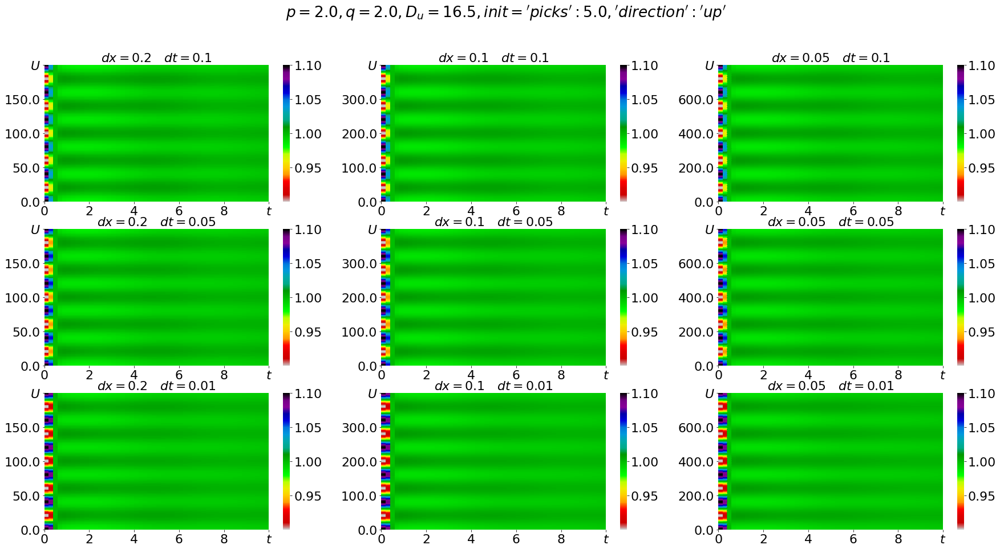

{'dx': 0.2, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.01, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 20, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.01, 't_max': 5000.0, 

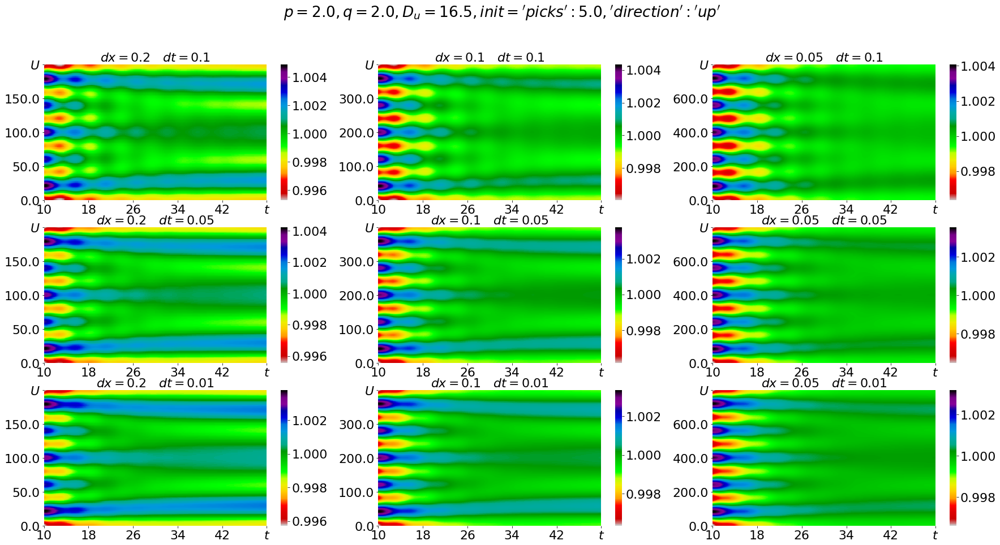

{'dx': 0.2, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.01, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 20, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.01, 't_max': 5000.0, 

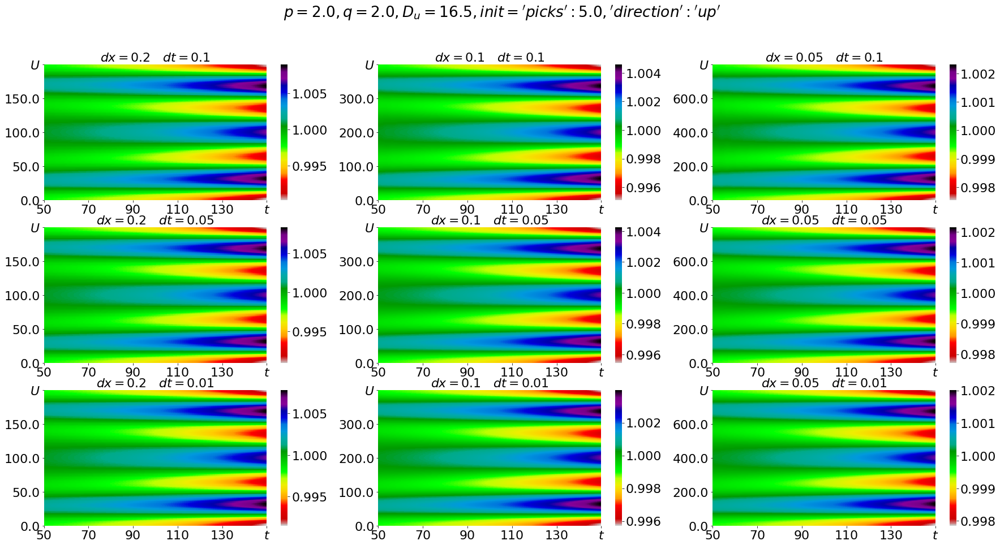

{'dx': 0.2, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.01, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 20, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.01, 't_max': 5000.0, 

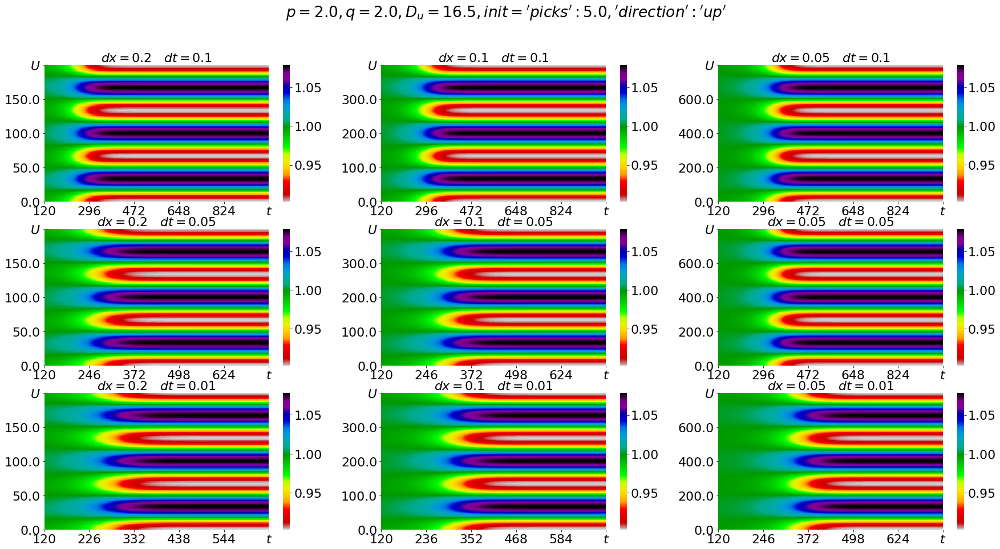


---------------------------



In [46]:
for i in range(1,6):
    draw_arr(res[i], left_border=0, right_border=10)
    draw_arr(res[i], left_border=10, right_border=50)
    draw_arr(res[i], left_border=50, right_border=150)
    draw_arr(res[i], left_border=120)
    print('\n---------------------------\n')

In [26]:
res1 = {}
conf = Higgins1DConfiguration(2.0, 2.0, 22, 1)
for peaks in tqdm([1,2,3,4,5,6,7,8]):
    res1[peaks] = []
    for dt in [0.1,0.05, 0.01]:
        for dx in [0.2,0.1,0.05]:
            u_init = get_cos(peaks, int(round(200*0.2/dx)),1.0, 0.1)
            v_init = get_cos(peaks, int(round(200*0.2/dx)),1.0, 0.1)
            params = Higgins1DTdmaParameters(u_init, v_init, dx, dt, 5000.0, save_timeline=True, timeline_save_step_delta=int(round(2*0.1/dt)))
            res1[peaks].append(integrate_tdma_implicit_scheme(conf, params))

100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:35<00:00,  4.40s/it]


{'dx': 0.2, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.01, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 20, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.01, 't_max': 5000.0, 

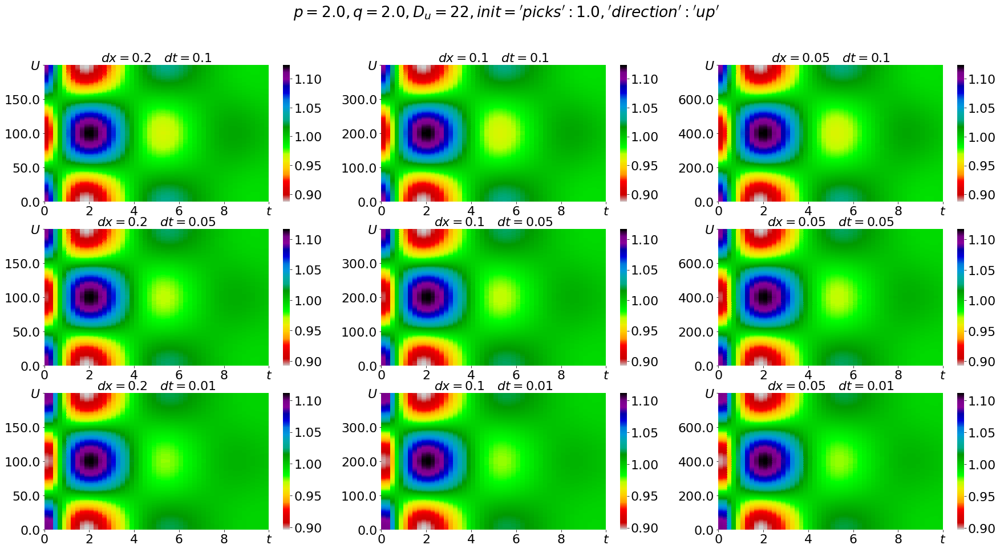

{'dx': 0.2, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.01, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 20, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.01, 't_max': 5000.0, 

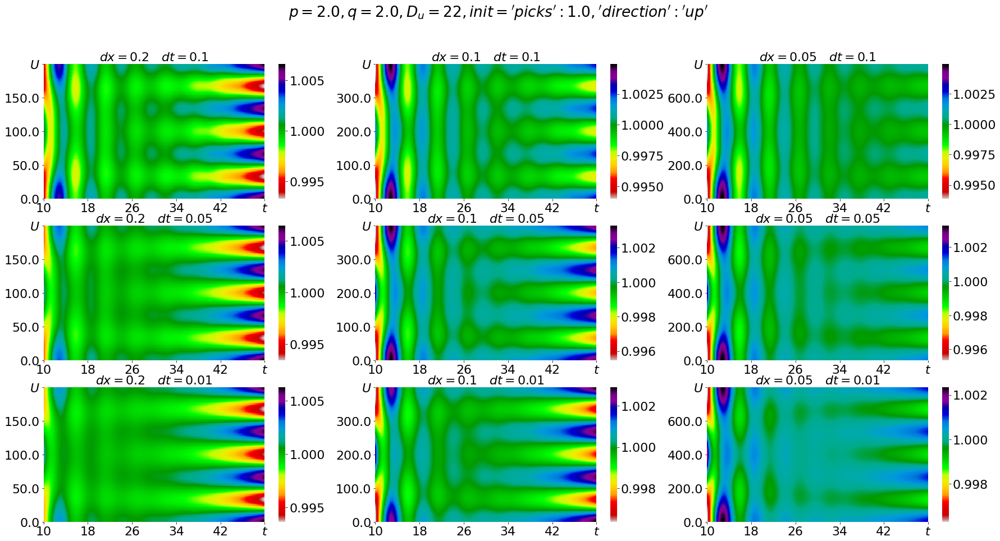

{'dx': 0.2, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.01, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 20, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.01, 't_max': 5000.0, 

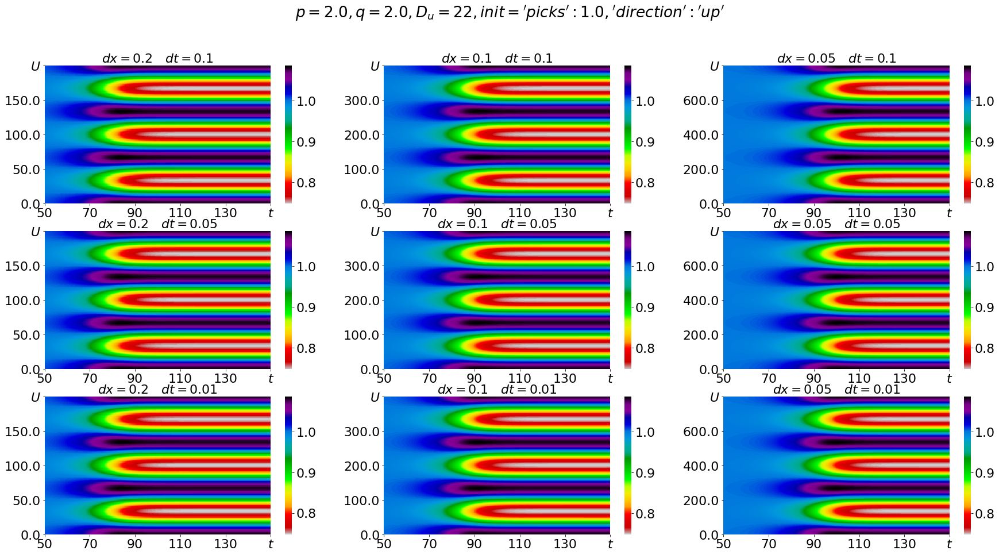

{'dx': 0.2, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.01, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 20, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.01, 't_max': 5000.0, 

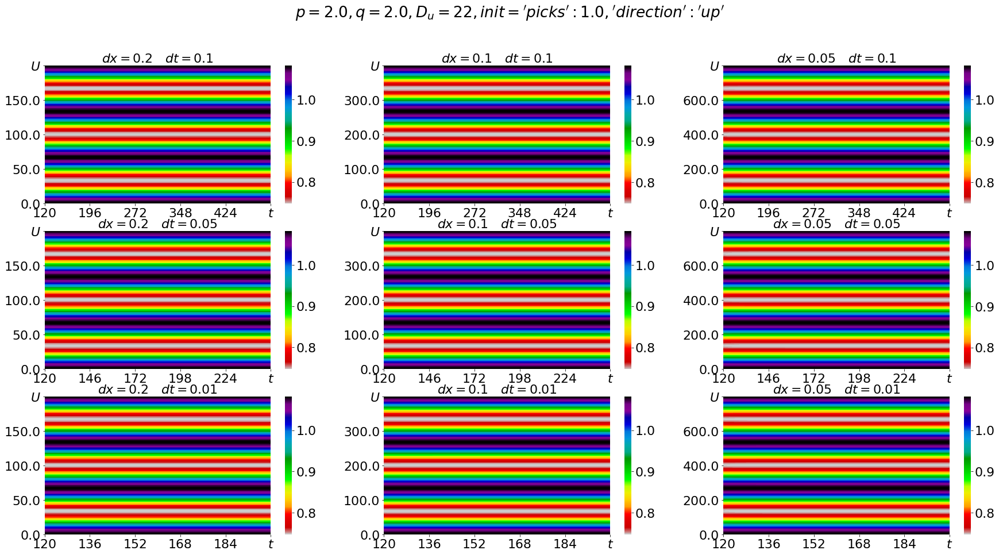


---------------------------

{'dx': 0.2, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.01, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 20, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1,

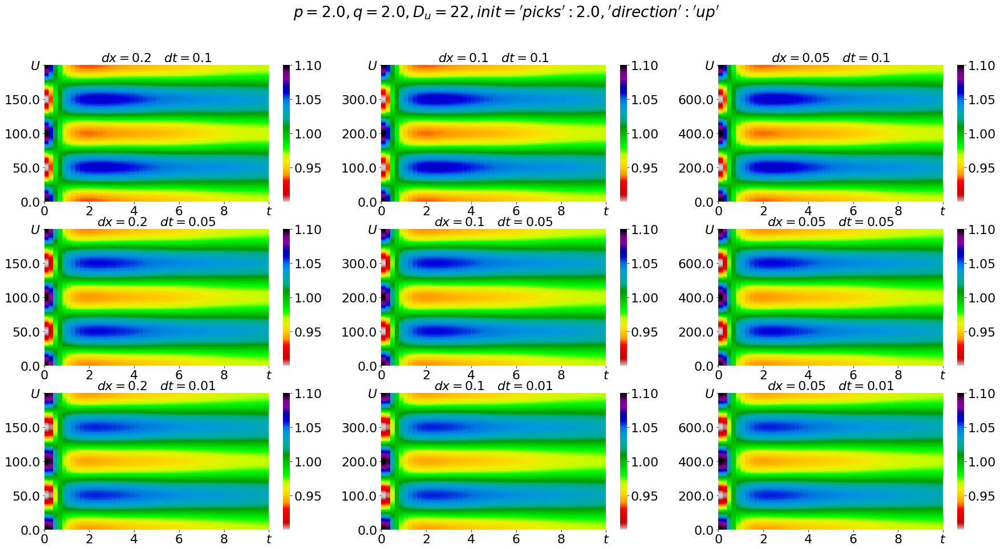

{'dx': 0.2, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.01, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 20, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.01, 't_max': 5000.0, 

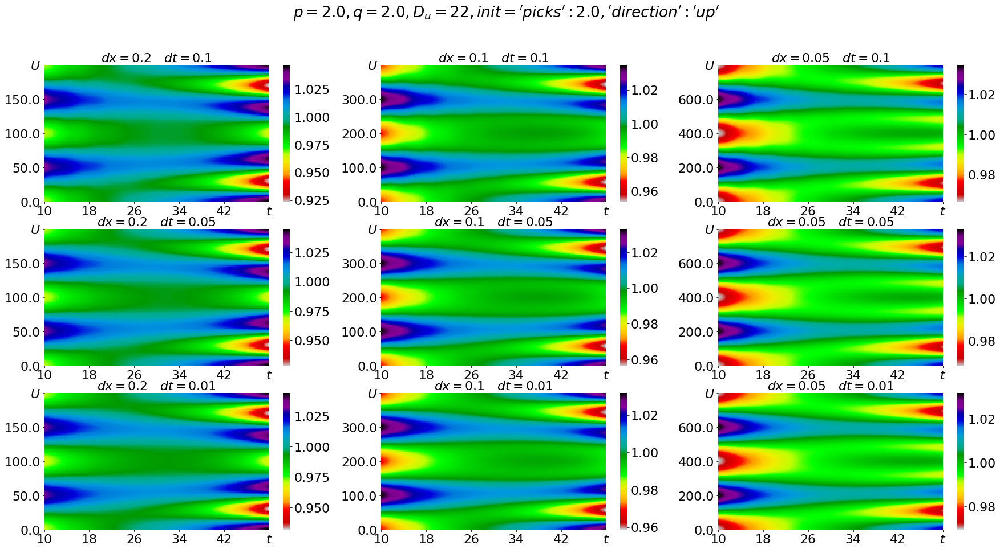

{'dx': 0.2, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.01, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 20, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.01, 't_max': 5000.0, 

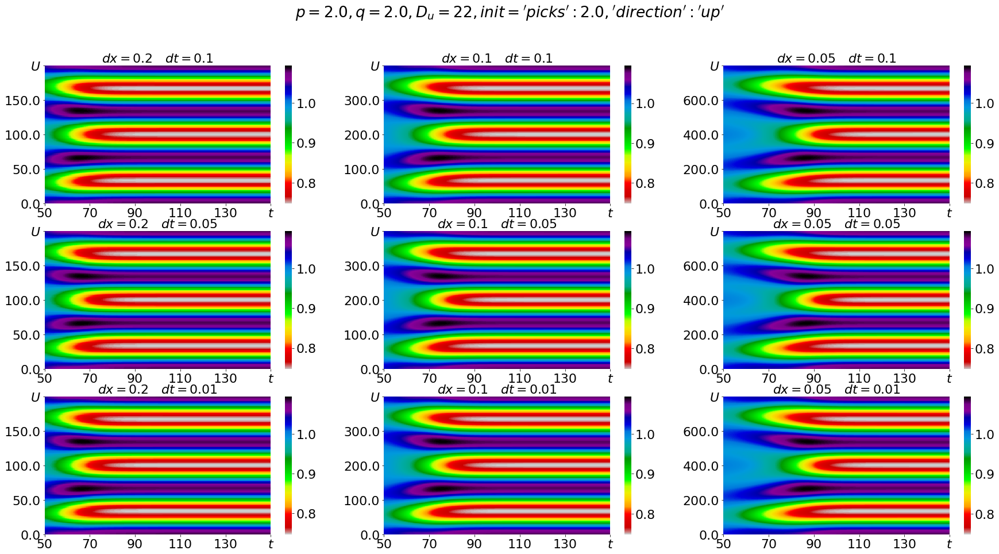

{'dx': 0.2, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.01, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 20, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.01, 't_max': 5000.0, 

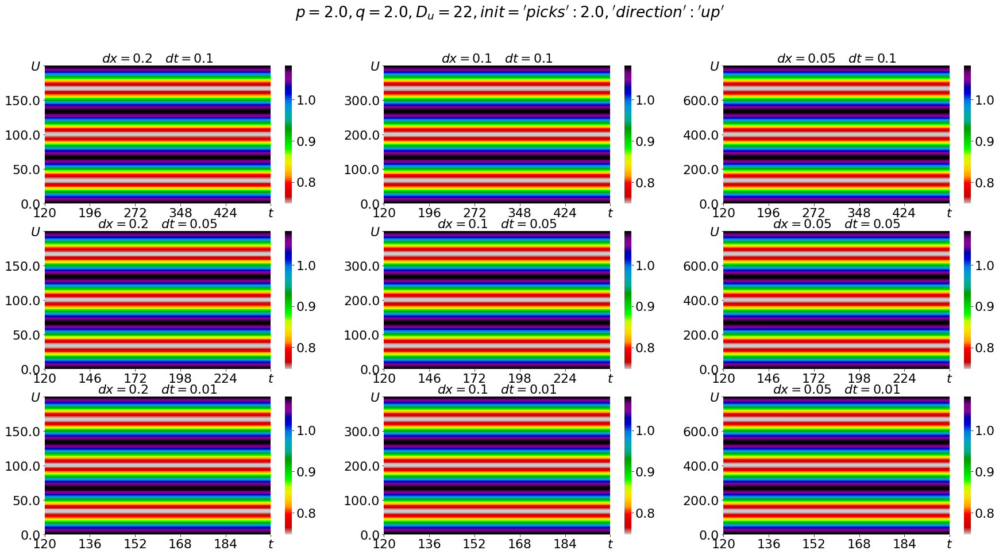


---------------------------

{'dx': 0.2, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.01, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 20, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1,

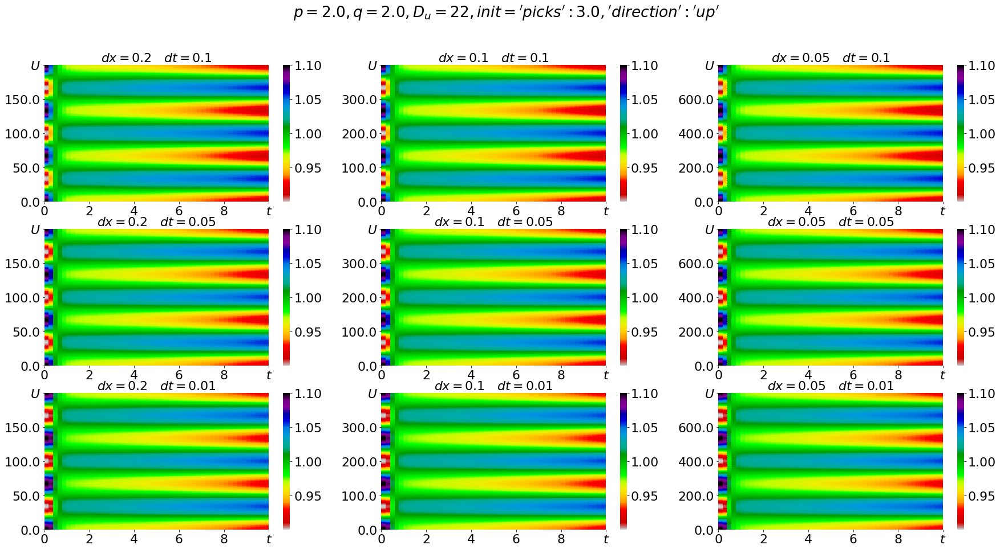

{'dx': 0.2, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.01, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 20, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.01, 't_max': 5000.0, 

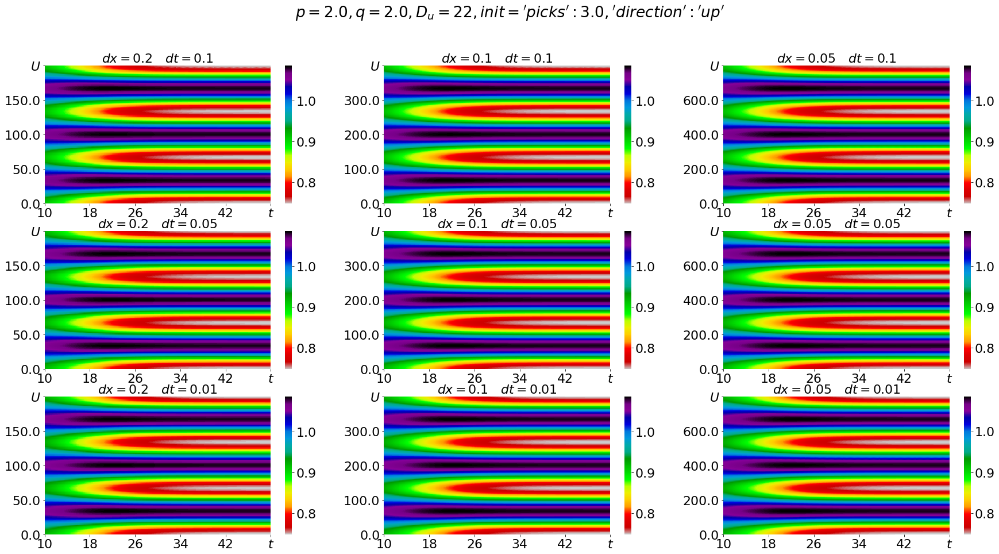

{'dx': 0.2, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.01, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 20, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.01, 't_max': 5000.0, 

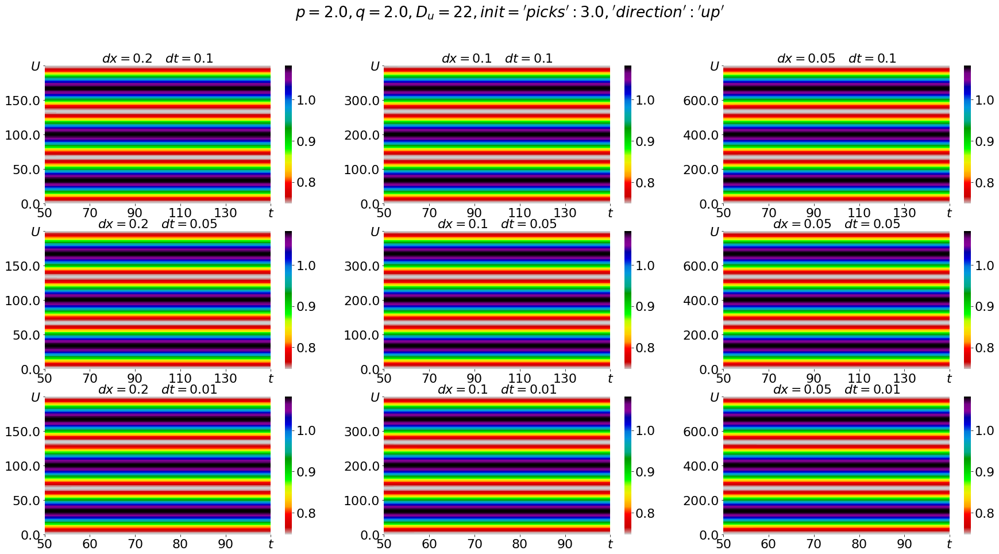

{'dx': 0.2, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.01, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 20, 'x_max': 40.0, 'method': 'tdma_implicit'}

---------------------------

{'dx': 0.2,

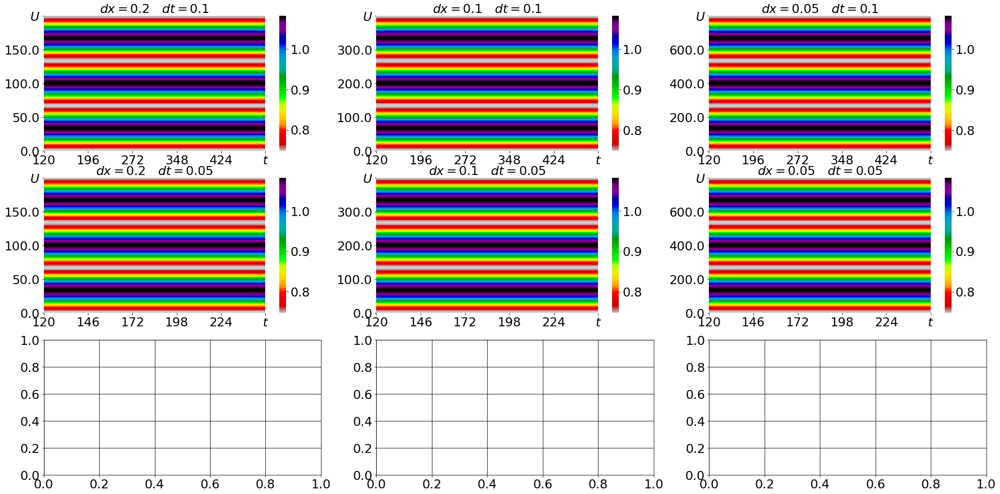

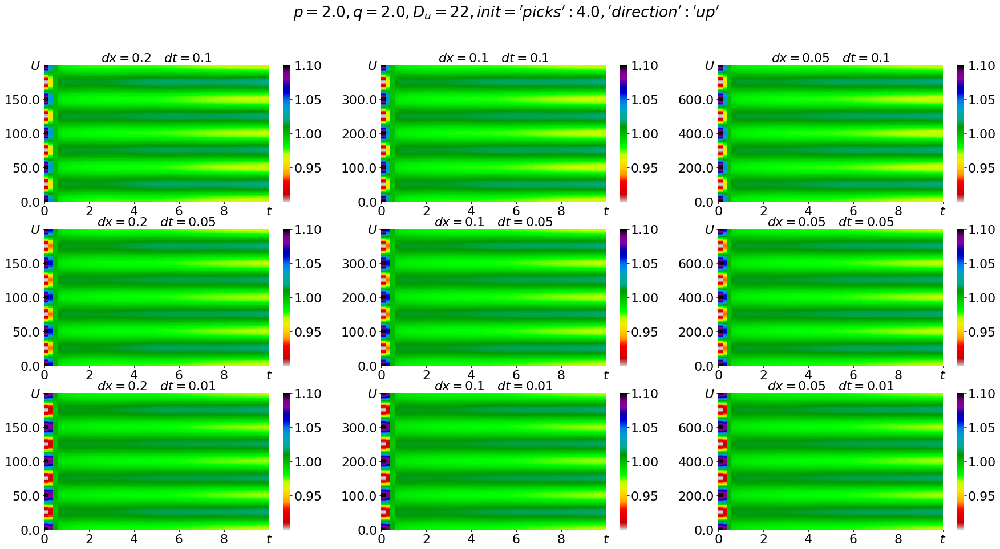

{'dx': 0.2, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.01, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 20, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.01, 't_max': 5000.0, 

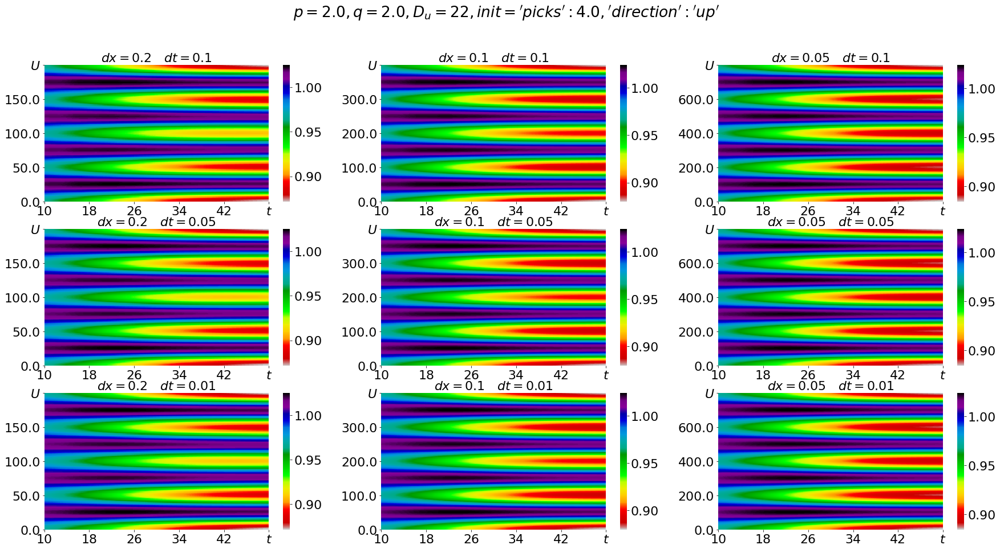

{'dx': 0.2, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.01, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 20, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.01, 't_max': 5000.0, 

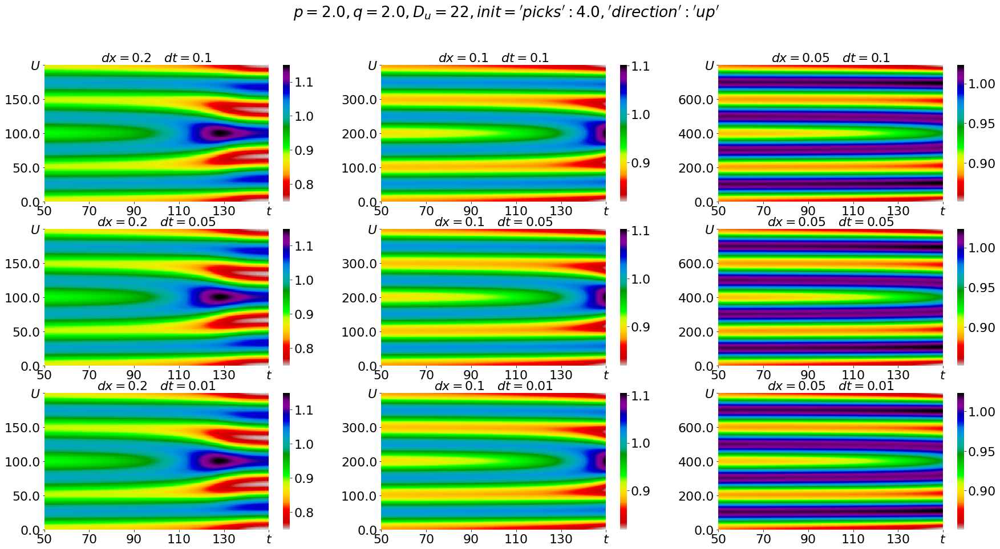

{'dx': 0.2, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.01, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 20, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.01, 't_max': 5000.0, 

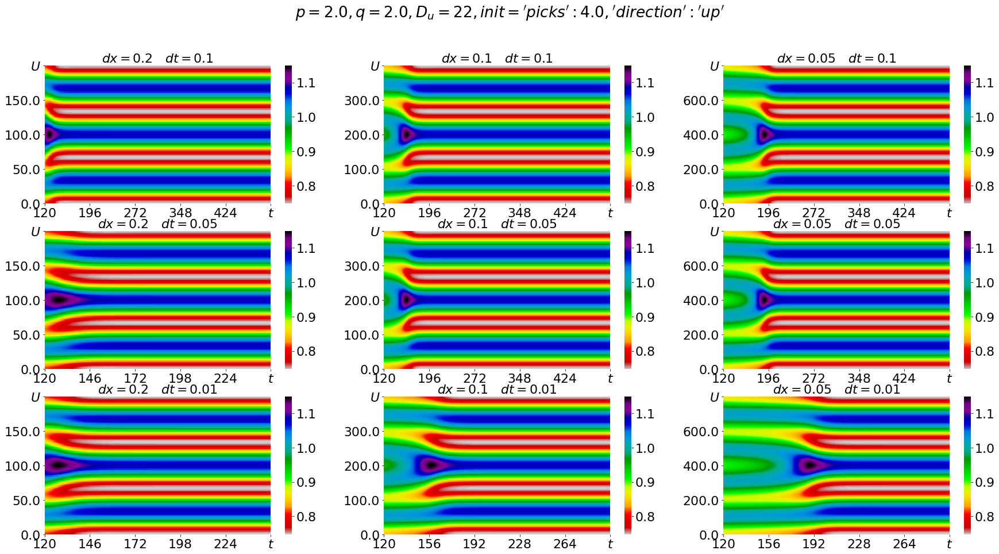


---------------------------

{'dx': 0.2, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.01, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 20, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1,

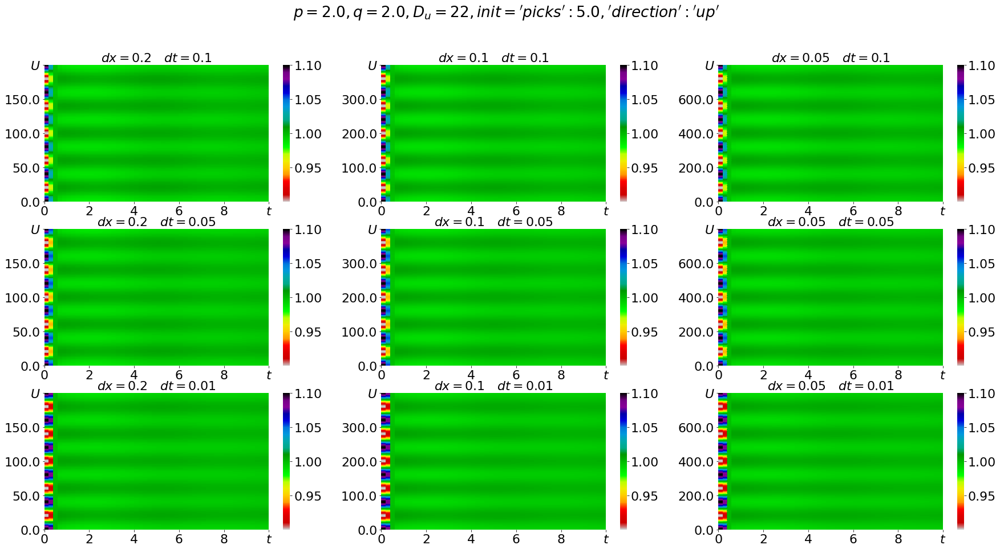

{'dx': 0.2, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.01, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 20, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.01, 't_max': 5000.0, 

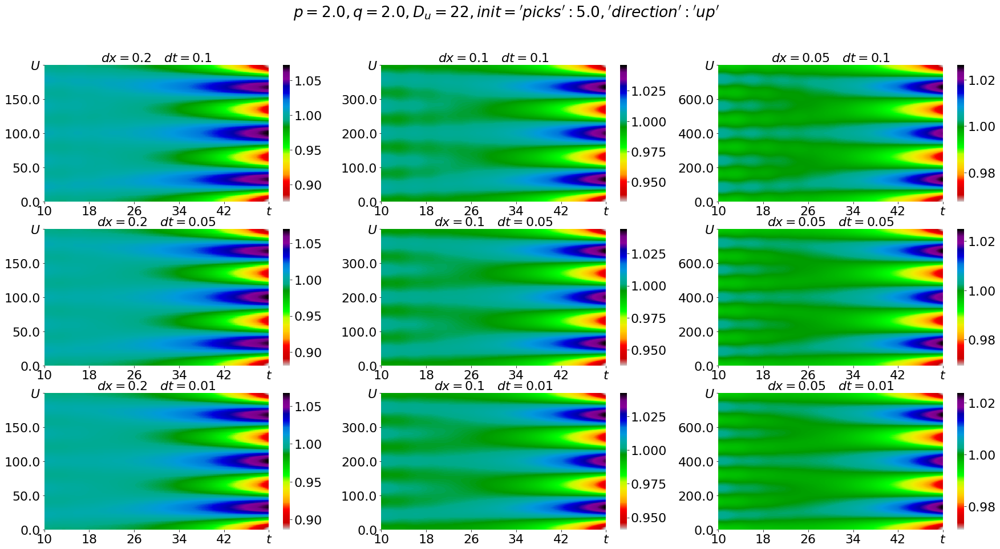

{'dx': 0.2, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.01, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 20, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.01, 't_max': 5000.0, 

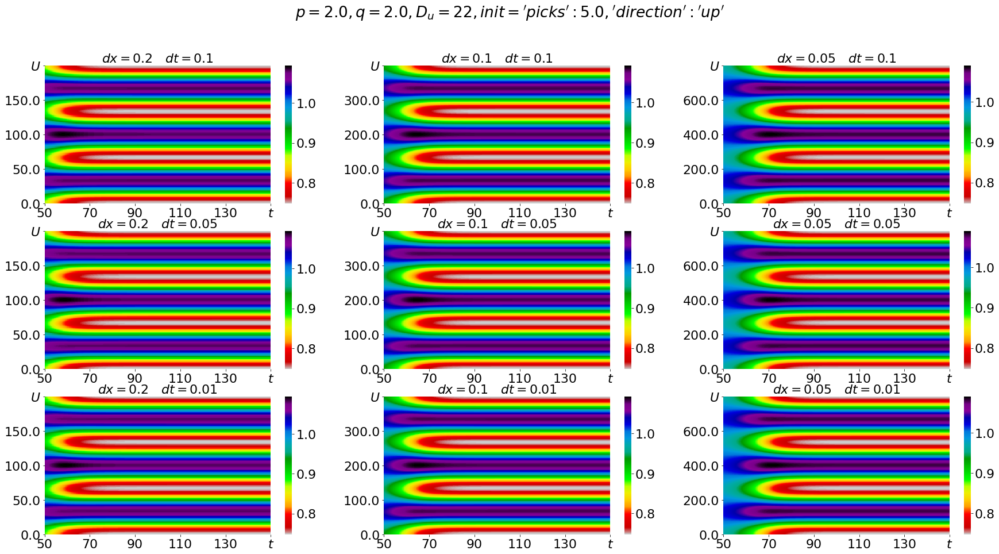

{'dx': 0.2, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.01, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 20, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.01, 't_max': 5000.0, 

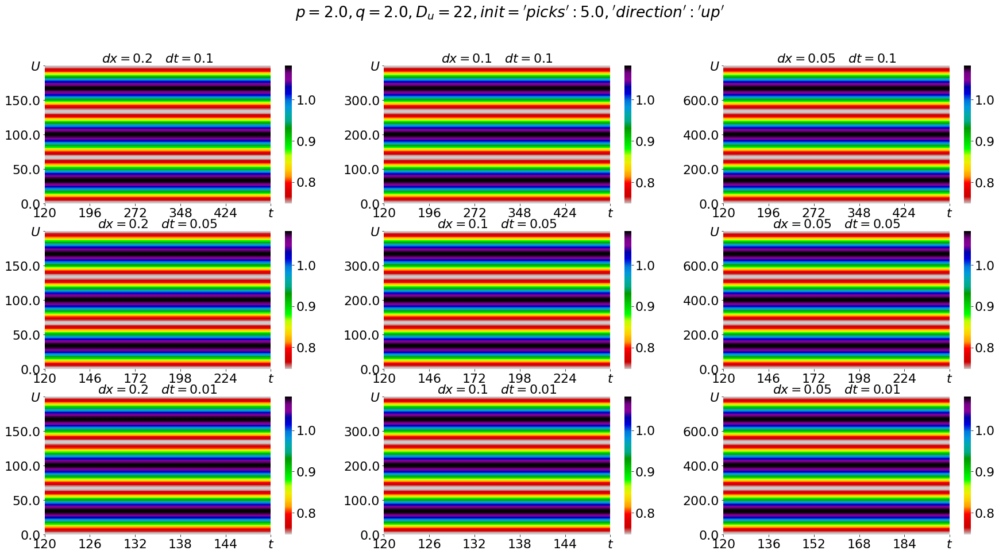


---------------------------

{'dx': 0.2, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.01, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 20, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1,

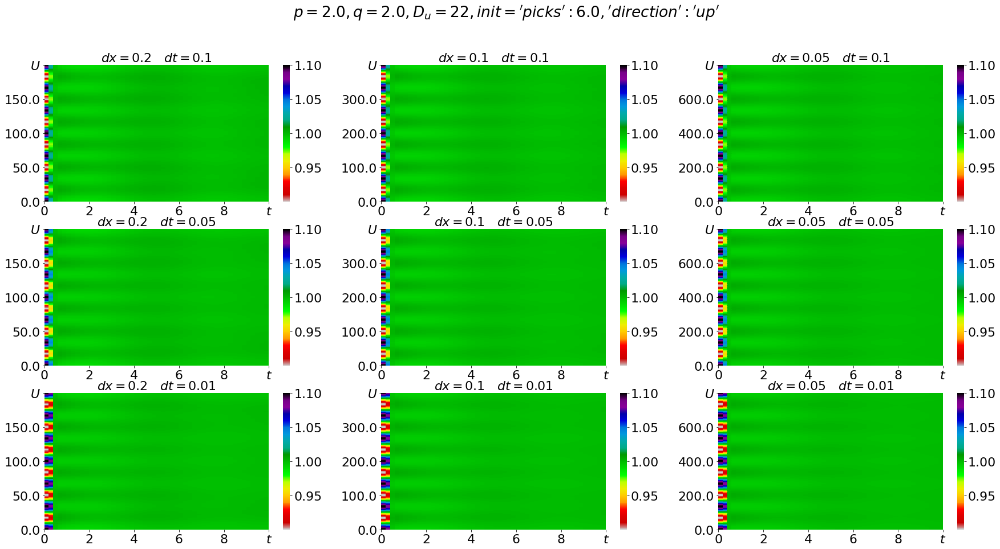

{'dx': 0.2, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.01, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 20, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.01, 't_max': 5000.0, 

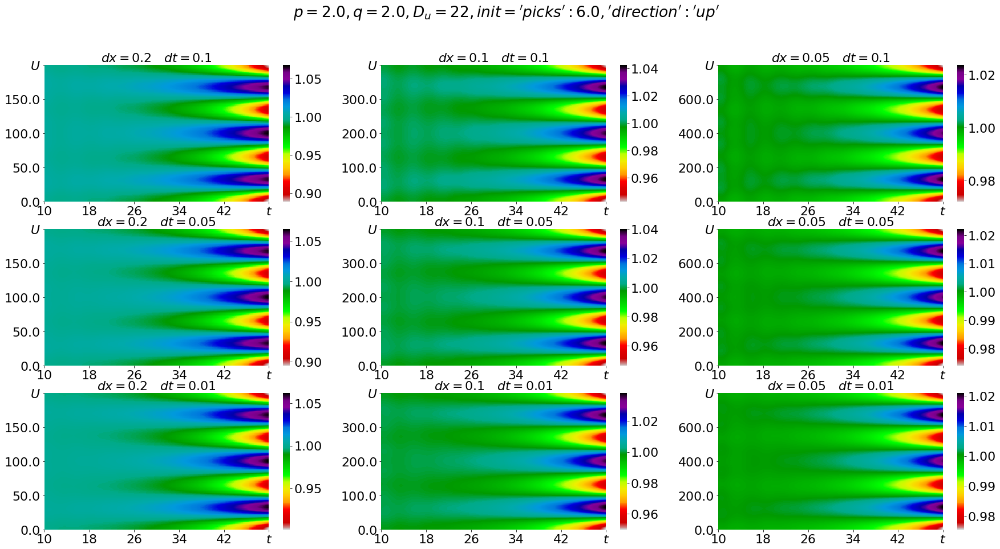

{'dx': 0.2, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.01, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 20, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.01, 't_max': 5000.0, 

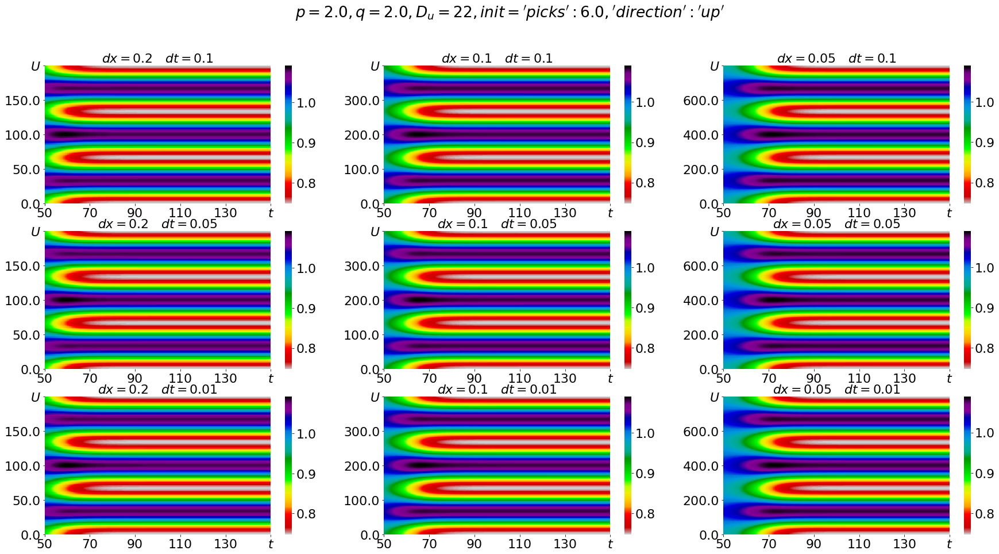

{'dx': 0.2, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.01, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 20, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.01, 't_max': 5000.0, 

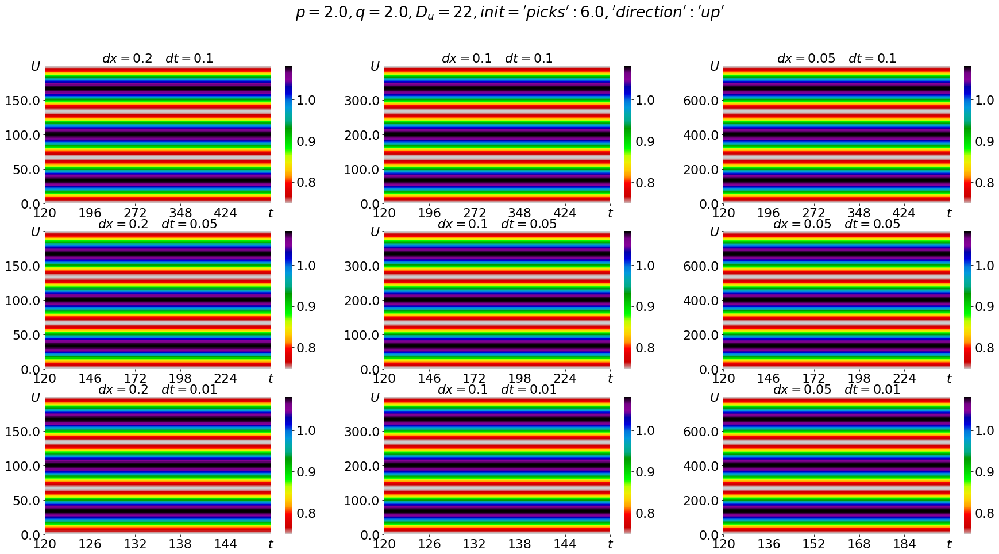


---------------------------

{'dx': 0.2, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.01, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 20, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1,

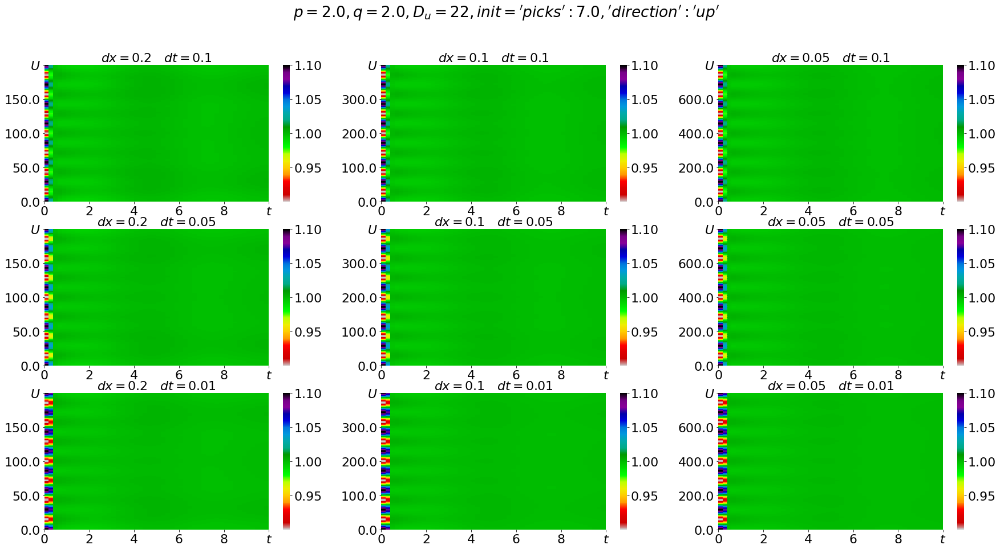

{'dx': 0.2, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.01, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 20, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.01, 't_max': 5000.0, 

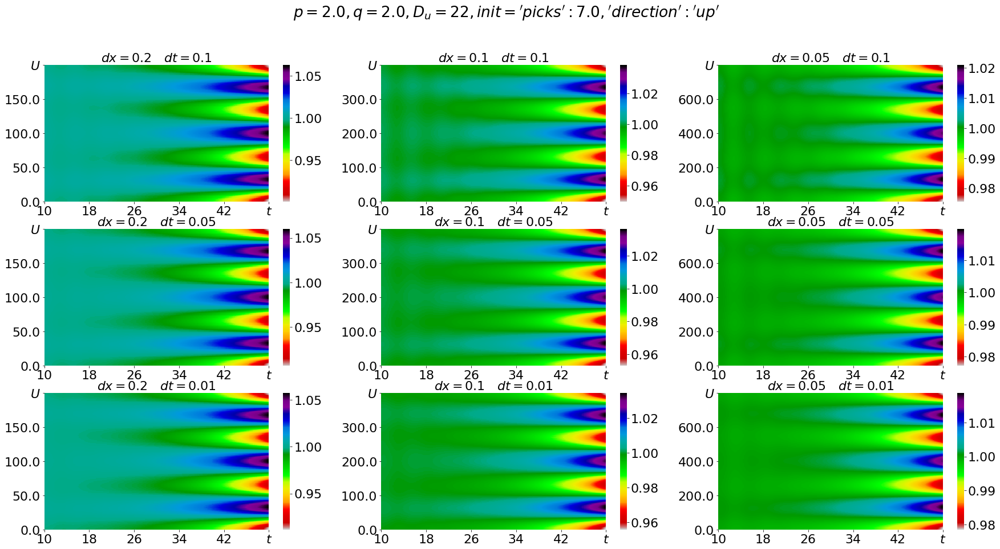

{'dx': 0.2, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.01, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 20, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.01, 't_max': 5000.0, 

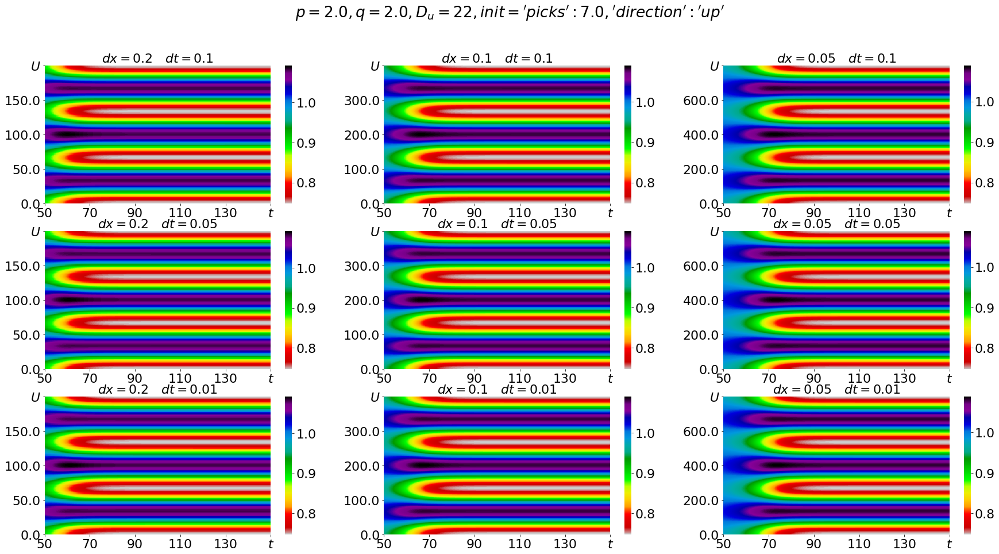

{'dx': 0.2, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.01, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 20, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.01, 't_max': 5000.0, 

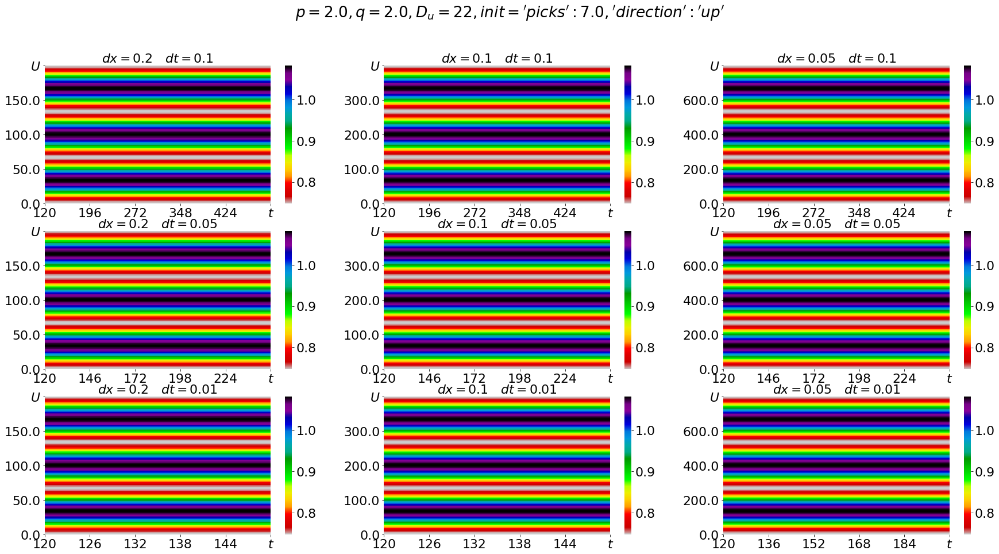


---------------------------

{'dx': 0.2, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.01, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 20, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1,

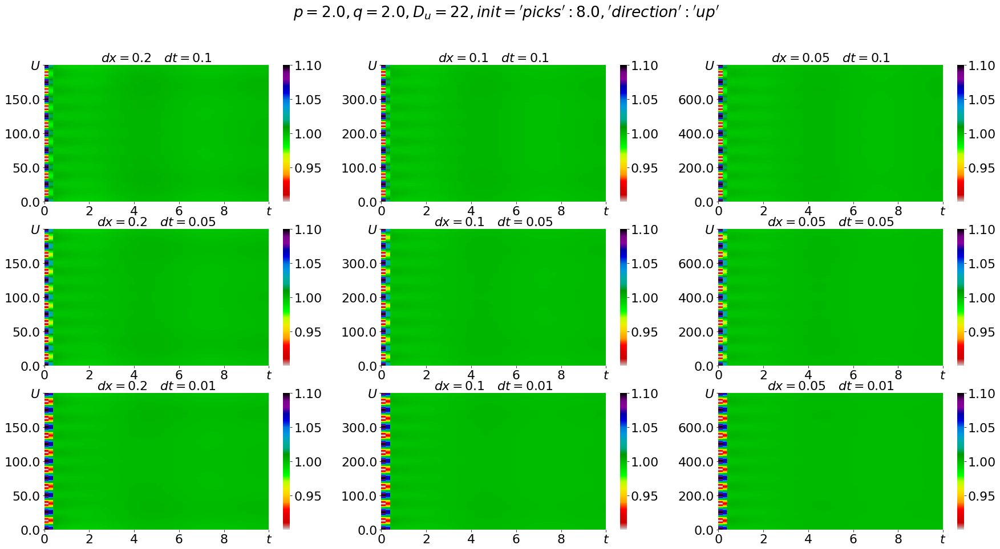

{'dx': 0.2, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.01, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 20, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.01, 't_max': 5000.0, 

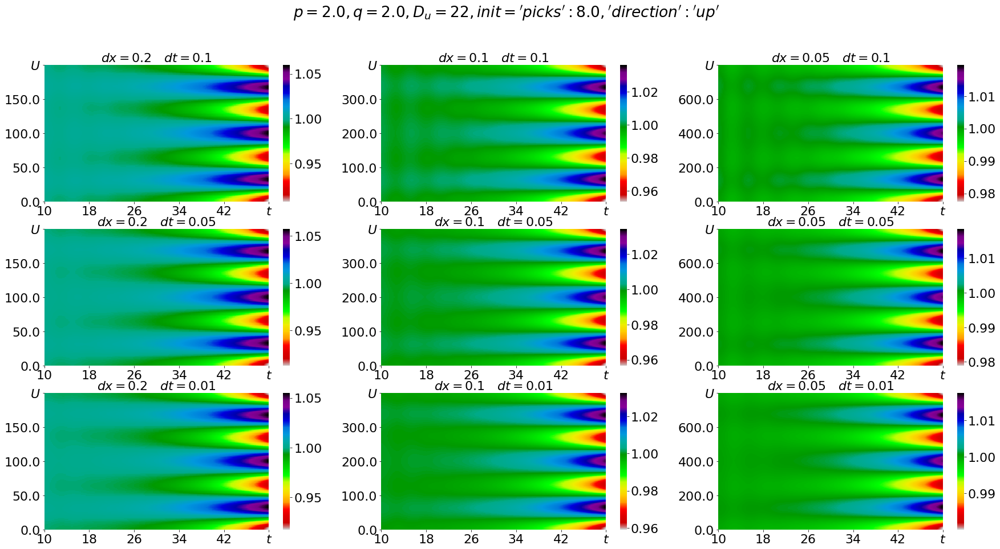

{'dx': 0.2, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.01, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 20, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.01, 't_max': 5000.0, 

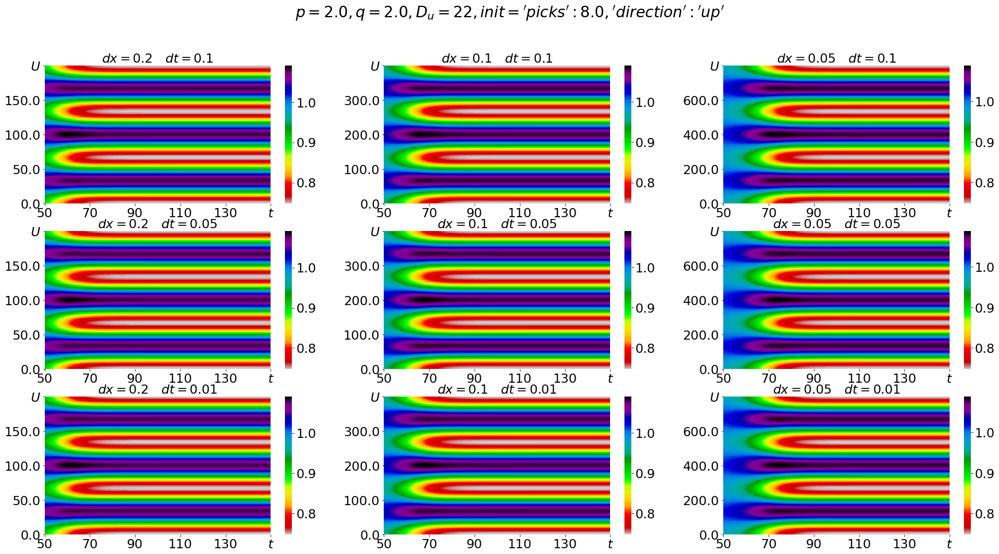

{'dx': 0.2, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.1, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 2, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.05, 'dt': 0.05, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 4, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.2, 'dt': 0.01, 't_max': 5000.0, 'save_timeline': True, 'timeline_save_step_delta': 20, 'x_max': 40.0, 'method': 'tdma_implicit'}
{'dx': 0.1, 'dt': 0.01, 't_max': 5000.0, 

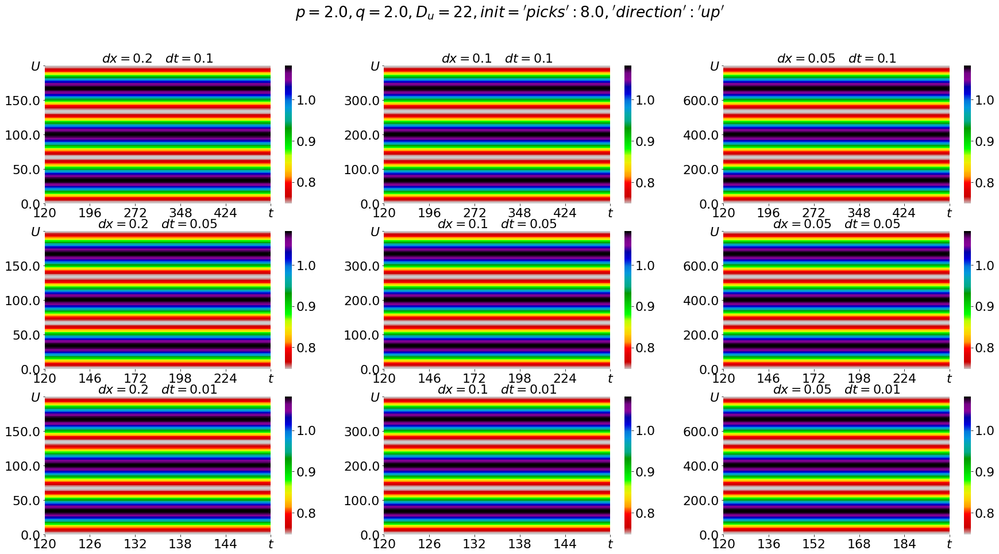


---------------------------



In [47]:
for i in range(1,9):
    draw_arr(res1[i], left_border=0, right_border=10)
    draw_arr(res1[i], left_border=10, right_border=50)
    draw_arr(res1[i], left_border=50, right_border=150)
    try:
        draw_arr(res1[i], left_border=120)
    except:
        ko = 3
    print('\n---------------------------\n')